In [ ]:
# Imports
library(Seurat)
library(SingleCellExperiment)
library(SingleR)
library(celldex)    
library(ggplot2)
library(clustree)
library(stringr) 
library(gridExtra)
library(dplyr)

# Change setting for visualizing plots within VSCODE
options(repr.plot.width=20, repr.plot.height=12)

# Read macrophage R object
macrophages <- readRDS("../../../data/R Objects/Macrophage R Objects/all_humans_macrophage_subset_v1.rds")

Warning message:
"package 'Seurat' was built under R version 4.4.2"
Loading required package: SeuratObject

Warning message:
"package 'SeuratObject' was built under R version 4.4.2"
Loading required package: sp

Warning message:
"package 'sp' was built under R version 4.4.2"

Attaching package: 'SeuratObject'


The following objects are masked from 'package:base':

    intersect, t


Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats

Warning message:
"package 'matrixStats' was built under R version 4.4.2"

Attaching package: 'MatrixGenerics'


The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, 

In [ ]:
# View amount of macrophage cells
ncol(macrophages)

[1] 16349

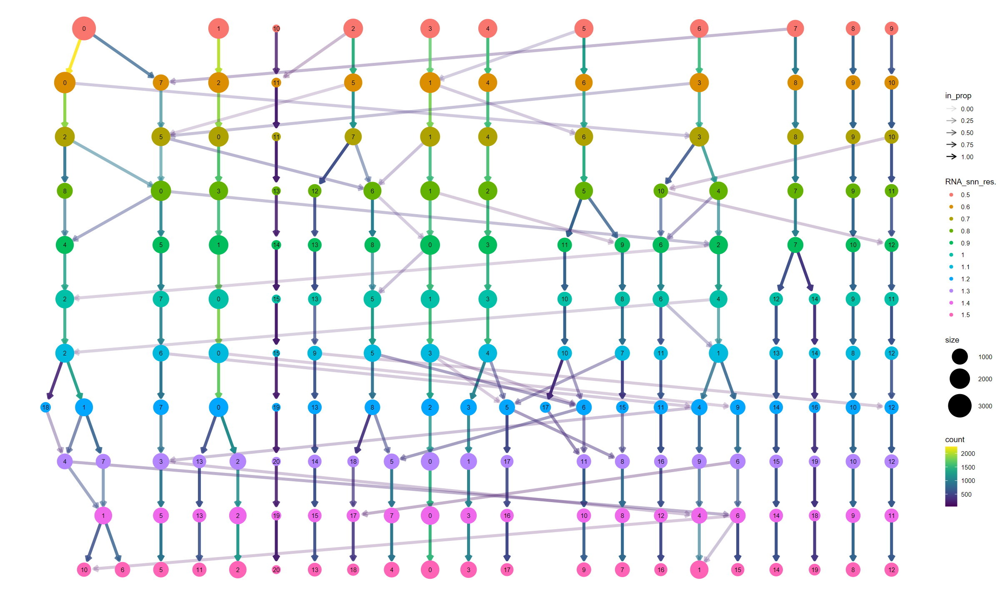

In [7]:
# This cell is meant to analyze the different resolutions and see which one is the best
clustree(macrophage_data, prefix= "RNA_snn_res.", layout = "sugiyama")

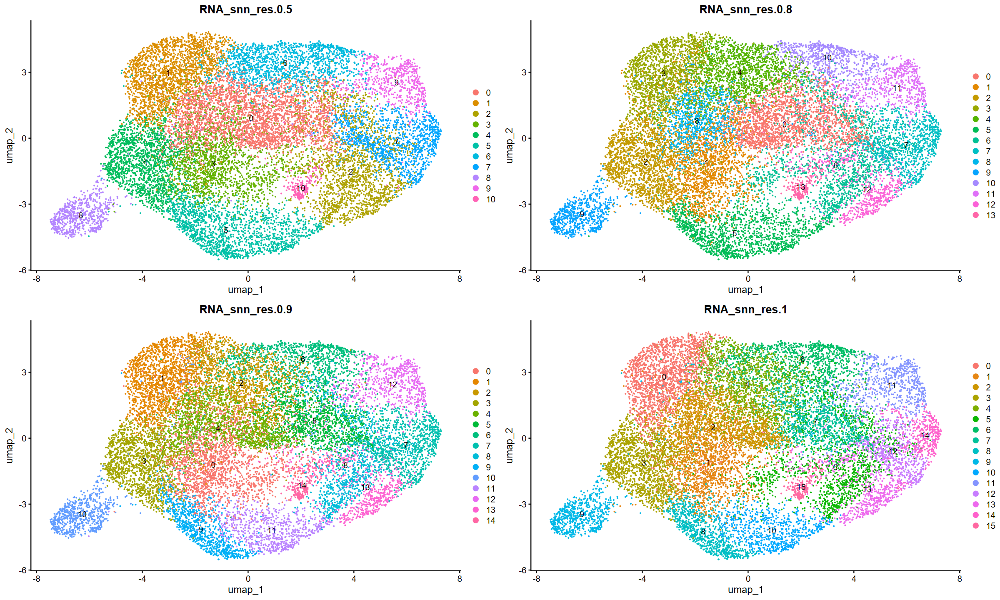

In [2]:
# Get DimPlots of different resolutions
res_1 <- DimPlot(macrophages, reduction = "umap", group.by = "RNA_snn_res.0.5", label = T)
res_2 <- DimPlot(macrophages, reduction = "umap", group.by = "RNA_snn_res.0.8", label = T)
res_3 <- DimPlot(macrophages, reduction = "umap", group.by = "RNA_snn_res.0.9", label = T)
res_4 <- DimPlot(macrophages, reduction = "umap", group.by = "RNA_snn_res.1", label = T)

# Plot
grid.arrange(res_1, res_2, res_3, res_4, ncol=2)

# Assign the slot "Seurat Cluster" to the desired resolution
macrophages$seurat_clusters <- macrophages$`RNA_snn_res.0.8`

In [ ]:
# View distribution of idents before assigning resolution
table(Idents(macrophages))

# Assign resolution to identity
macrophages <- SetIdent(macrophages, value = "RNA_snn_res.0.8")

# View distribution of idents after assigning resolution
table(Idents(macrophages))


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1531 1493 1266 1084  914  907  890  803  764  740  689  682  680  625  589  558 
  16   17   18   19   20 
 539  528  445  397  225 


   0    1    2    3    4    5    6    7    8    9   10   11   12   13 
2003 1781 1674 1637 1517 1441 1413  977  975  782  745  596  583  225 

Calculating cluster 0



Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Warning message in DoHeatmap(macrophages, features = top10$gene, size = 1, angle = 0, :
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: UQCRB, ZNF618, PALD1"
Warning message in viridisLite::viridis(n, alpha, begin, end, direction, option):
"Option 'blue' does not exist. Defaulting to 'viridis'."
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


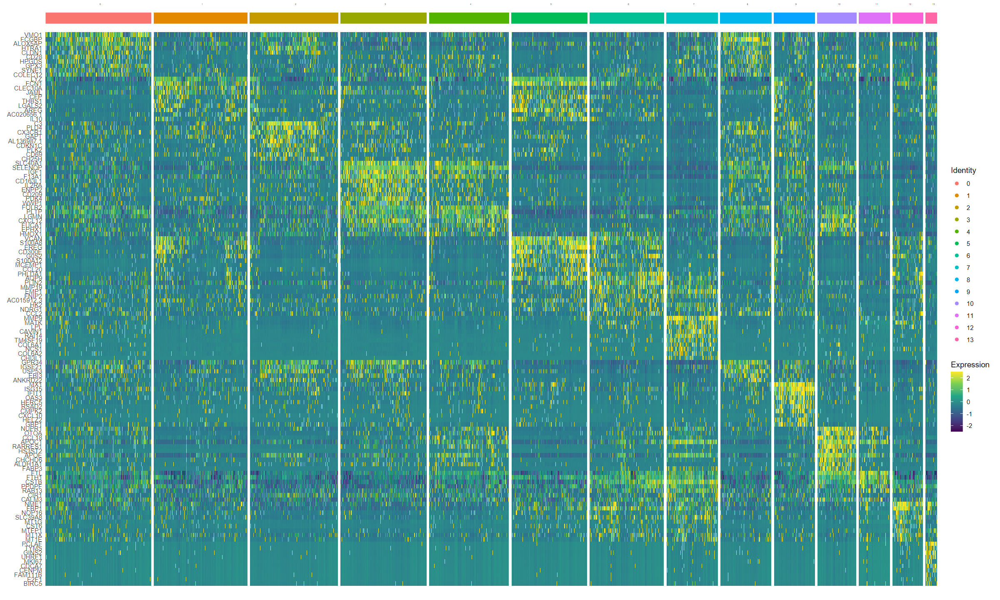

In [ ]:
# Findmarkers for each cluster
markers <- FindAllMarkers(macrophages, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
markers %>%
  group_by(cluster) %>%
  dplyr::filter(avg_log2FC > .75) %>%
  slice_head(n = 10) %>%
  ungroup() -> top10

# Heatmap
top10 <- markers %>% group_by(cluster) %>% top_n(10, avg_log2FC)
DoHeatmap(macrophages, features = top10$gene, size=1, angle=0, raster=FALSE) &
  scale_fill_viridis_c(option="blue",na.value = "white")

In [ ]:
# Filter markers
markers %>% group_by(cluster) %>% filter(as.numeric(as.character(cluster)) > 8) %>% filter(p_val_adj < 0.05) %>% slice_max(order_by = avg_log2FC, n = 10) %>% arrange(cluster, desc(pct.1)) 

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,3.887971,0.880,0.340,0.000000e+00,9,ISG15
0.000000e+00,3.691849,0.822,0.184,0.000000e+00,9,MX1
0.000000e+00,4.531422,0.600,0.080,0.000000e+00,9,IFIT1
0.000000e+00,3.413092,0.505,0.076,0.000000e+00,9,OAS3
0.000000e+00,3.782333,0.503,0.078,0.000000e+00,9,HERC5
9.837476e-211,3.360803,0.496,0.126,4.885586e-206,9,GBP1
0.000000e+00,4.830452,0.439,0.033,0.000000e+00,9,RSAD2
0.000000e+00,3.746721,0.412,0.041,0.000000e+00,9,CMPK2
0.000000e+00,6.228129,0.317,0.021,0.000000e+00,9,CXCL10


In [ ]:
# Set identity equal to seurat clusters
macrophages <- SetIdent(macrophages, value = "seurat_clusters")

# Some marker genes according to Winther & Willemsen
features_inflammatory <- c("S100A8", "S100A9", "IL1B", "CASP1", "CASP4", "NLRP3")
features_resident <- c("LYVE1", "CX3CR1", "FOLR2", "C1QA", "C1QB", "C1QC", "CD74")  #, "HLA-DRA", "HLA-DRB1"
features_trem2 <- c("TREM2", "CD9", "FABP5", "APOE", "APOC1")
features_ifnic <- c("ISG15", "IRF7", "IFIT3", "IFIT1")
features_proliferating <- c("STMN1", "TOP2A", "MKI67", "TUBA1B", "TUBB5")
features_ILAM <- c("TREM1", "CCL2", "PLIN2", "SPINK1", "DEFB1", "IL1B", "CCL7", "OLR1", "H2-DMA", "H2-DMB1")

# Add a module score to the Seurat object
macrophages <- AddModuleScore(macrophages, features = list(features_inflammatory), name = "FeatureGeneScore_inflammatory")
macrophages <- AddModuleScore(macrophages, features = list(features_resident), name = "FeatureGeneScore_resident_like")
macrophages <- AddModuleScore(macrophages, features = list(features_trem2), name = "FeatureGeneScore_trem2")
macrophages <- AddModuleScore(macrophages, features = list(features_ifnic), name = "FeatureGeneScore_ifnic")
macrophages <- AddModuleScore(macrophages, features = list(features_proliferating), name = "FeatureGeneScore_proliferating")
macrophages <- AddModuleScore(macrophages, features = list(features_ILAM), name = "FeatureGeneScore_ilam")

# Vln plots
inflammatory_vln <- VlnPlot(macrophages, features = "FeatureGeneScore_inflammatory1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for inflammatory macrophage markers")
residents_vln <- VlnPlot(macrophages, features = "FeatureGeneScore_resident_like1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for resident-like macrophage markers")
trem2_vln <- VlnPlot(macrophages, features = "FeatureGeneScore_trem21", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for trem2 foamy macrophage markers")
ifn_vln <- VlnPlot(macrophages, features = "FeatureGeneScore_ifnic1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for IFNIC macrophage markers")
proliferating_vln <- VlnPlot(macrophages, features = "FeatureGeneScore_proliferating1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for proliferating macrophage markers")
ilam_vln <- VlnPlot(macrophages, features = "FeatureGeneScore_ilam1", group.by = "seurat_clusters") + 
  ggtitle("FeatureGeneScores for ILAM macrophage markers")
  
# Visualizing DotPlots to view marker genes
inflammatory_dot <- DotPlot(macrophages, features = features_inflammatory) + 
  ggtitle("Inflammatory Macrophages") + RotatedAxis()

resident_dot <- DotPlot(macrophages, features = features_resident) + 
  ggtitle("Resident-Like Macrophages")

TREM2_dot <- DotPlot(macrophages, features = features_trem2) + 
  ggtitle("TREM2 'Foamy' Macrophages")

IFNIC_dot <- DotPlot(macrophages, features = features_ifnic) + 
  ggtitle("IFNIC Macrophages")

proliferating_dot <- DotPlot(macrophages, features = features_proliferating) + 
  ggtitle("Proliferating Macrophages")

ilam_dot <- DotPlot(macrophages, features = features_ILAM) + 
  ggtitle("PLIN2 / TREM1 Macrophages")

Warning message:
"The following features are not present in the object: TUBB5, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: H2-DMA, H2-DMB1, not searching for symbol synonyms"
Warning message:
"The following requested variables were not found: TUBB5"
Warning message:
"The following requested variables were not found: H2-DMA, H2-DMB1"


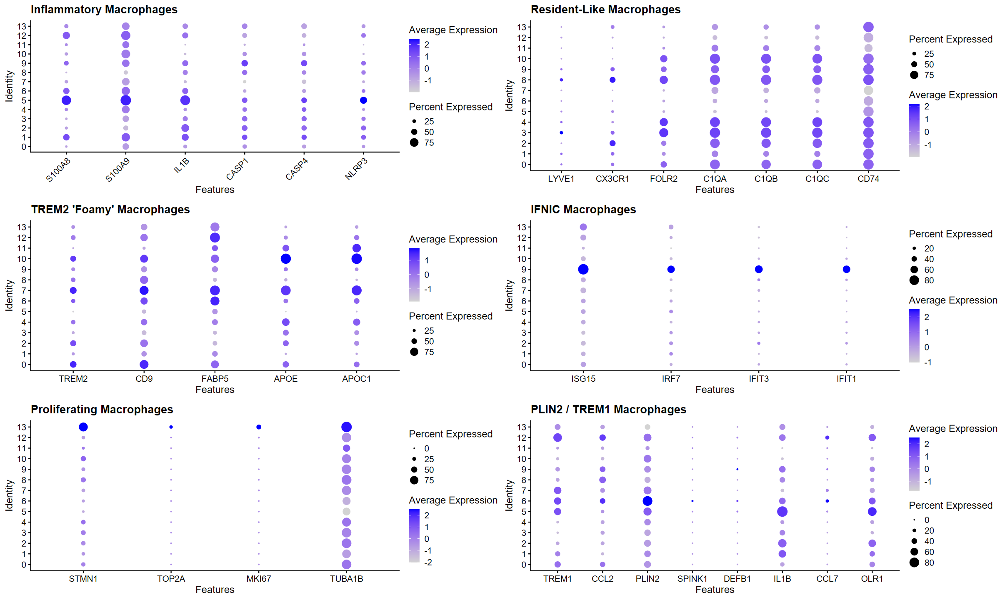

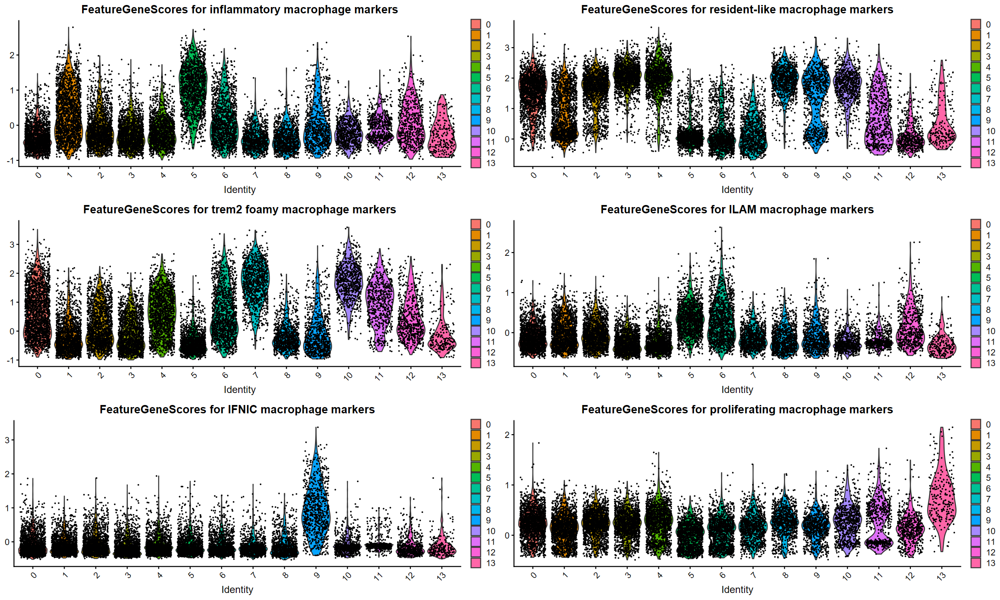

In [17]:
# Plot
macrophages <- SetIdent(macrophages, value = "seurat_clusters")
grid.arrange(inflammatory_dot, resident_dot, TREM2_dot, IFNIC_dot, proliferating_dot, ilam_dot, ncol = 2)
grid.arrange(inflammatory_vln, residents_vln, trem2_vln, ilam_vln, ifn_vln, proliferating_vln, ncol=2)

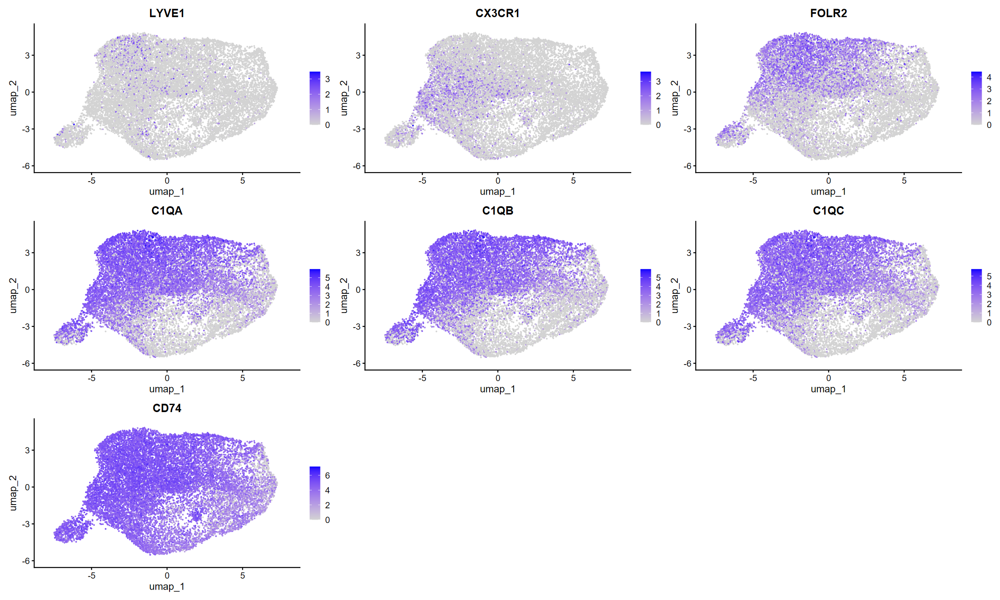

In [ ]:
# Create featureplot of resident-like gene markers
FeaturePlot(macrophages, reduction="umap", features = features_resident)

In [45]:
# FindMarkers between cluster 2 and c(Inflammation, Resident-like & TREM2 FOAMY)
known_clusters = list("7", "5", "1")
# Reset Idents
macrophages <- SetIdent(macrophages, value = "seurat_clusters")

find_markers <- lapply(known_clusters, function(known) {
  FindMarkers(macrophages, ident.1 = "9", ident.2 = known,  only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25) %>%
    filter(p_val_adj < 0.05) %>%
    slice_max(order_by = avg_log2FC, n = 10) %>%
    arrange(desc(pct.1))
})

names(find_markers) <- c("trem2", "inflam", "resident")
find_markers$trem2
find_markers$inflam
find_markers$resident

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
FTL,1.212153e-154,1.692261,1.000,0.999,6.019915e-150
TPT1,1.305570e-100,1.174780,0.985,0.983,6.483854e-96
HLA-DPB1,2.992394e-31,1.813465,0.711,0.695,1.486113e-26
C1QA,1.102542e-10,1.268287,0.645,0.664,5.475552e-06
HLA-DPA1,1.058153e-09,1.304352,0.632,0.719,5.255105e-05
C1QB,1.185697e-17,1.846024,0.569,0.511,5.888525e-13
NUPR1,2.069389e-14,1.220663,0.526,0.436,1.027721e-09
SELENOP,1.323636e-48,3.238235,0.483,0.218,6.573571e-44
CCL18,2.361945e-21,3.658381,0.332,0.170,1.173013e-16


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
FTL,6.676198e-276,3.346657,1.000,0.998,3.315600e-271
CSTB,8.975297e-153,3.103346,0.889,0.752,4.457402e-148
APOC1,8.789137e-265,5.843536,0.838,0.143,4.364949e-260
APOE,2.215396e-176,5.464736,0.663,0.120,1.100232e-171
NUPR1,4.983564e-194,7.919804,0.526,0.020,2.474987e-189
RAB13,1.231543e-30,3.938622,0.426,0.256,6.116212e-26
CCL18,5.144080e-121,9.409489,0.332,0.007,2.554704e-116
CD59,1.494905e-36,4.002540,0.317,0.122,7.424149e-32
GYPC,1.443884e-27,3.218638,0.315,0.149,7.170763e-23


,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
FTL,8.486129e-278,2.881403,1.000,1.000,4.214466e-273
LGALS1,1.164337e-202,2.947060,0.917,0.625,5.782445e-198
CSTB,2.330566e-183,3.690608,0.889,0.719,1.157429e-178
APOC1,5.513204e-171,3.773287,0.838,0.424,2.738023e-166
FABP5,8.137018e-40,2.753912,0.535,0.369,4.041087e-35
NUPR1,2.385695e-98,3.706009,0.526,0.167,1.184808e-93
RAB13,3.112708e-25,3.608127,0.426,0.294,1.545864e-20
CCL18,4.759997e-59,2.986838,0.332,0.084,2.363958e-54
OTOA,8.291645e-30,2.833232,0.295,0.126,4.117880e-25


In [ ]:
# Assign annotations of found DGE analysis
macrophages <- SetIdent(macrophages, value = "seurat_clusters")
macrophages <- RenameIdents(macrophages,
                                   '0' = 'Inflammatory Macrophages',  # was Inflammatory Resident-like
                                   '1' = 'Inflammatory Macrophages',
                                   '2' = 'Inflammatory Macrophages', 
                                   '3' = 'Resident-like Macrophages', #3
                                   '4' = 'Resident-like Macrophages',
                                   '5' = 'Inflammatory Macrophages',
                                   '6' = 'TREM1/PLIN2 Macrophages',
                                   '7' = 'TREM2 Macrophages',
                                   '8' = 'Inflammatory Macrophages', # was Inflammatory Resident-like
                                   '9' = 'IFNIC Macrophages',
                                   '10' = 'TREM2 Macrophages',
                                   '11' = 'TREM2 Macrophages',
                                   '12' = 'TREM1/PLIN2 Macrophages',
                                   '13' = 'Proliferating Macrophages')
    

# Proportion tables
#annotations_per_origin <- table(Idents(macrophages), macrophages$orig.ident)
annotations_per_origin_prop <- prop.table(table(Idents(macrophages))) * 100

# Subtype plots after annotation
subtype_annotated_plot <- DimPlot(macrophages, reduction = "umap", label = TRUE)
subtype_origin_plot <- DimPlot(macrophages, reduction = "umap", group.by = "orig.ident", label = TRUE)


# Combine tables side by side
combined_df <- cbind(annotations_per_origin_prop)

,annotations_per_origin_prop
Inflammatory Macrophages,48.161967
Resident-like Macrophages,19.291700
TREM1/PLIN2 Macrophages,12.208698
TREM2 Macrophages,14.178237
IFNIC Macrophages,4.783167
Proliferating Macrophages,1.376231


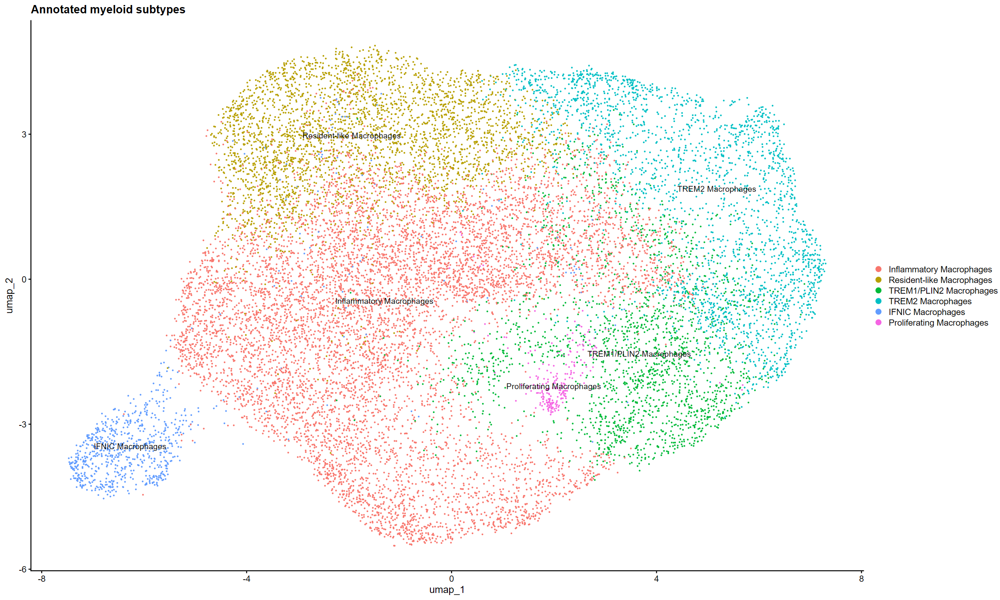

In [7]:
# Plot table
combined_df

# Plotting annotations and titles
grid.arrange(
    subtype_annotated_plot + ggtitle("Annotated myeloid subtypes")
    #subtype_origin_plot + ggtitle("DimPlot by origin")
    #ncol=1
)

In [ ]:
# Save result of normal-res annotation
saveRDS(macrophages, "all_humans_macrophage_data_annotatedv2.rds")